<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import" data-toc-modified-id="Import-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Import</a></span></li><li><span><a href="#Settings" data-toc-modified-id="Settings-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Settings</a></span></li><li><span><a href="#Functions" data-toc-modified-id="Functions-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>Functions</a></span></li><li><span><a href="#Data-mining" data-toc-modified-id="Data-mining-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Data mining</a></span><ul class="toc-item"><li><span><a href="#Univocal-patients-per-cancer-type" data-toc-modified-id="Univocal-patients-per-cancer-type-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>Univocal patients per cancer type</a></span></li><li><span><a href="#Total-number-of-patients" data-toc-modified-id="Total-number-of-patients-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>Total number of patients</a></span></li><li><span><a href="#Number-of-images-per-cancer-type" data-toc-modified-id="Number-of-images-per-cancer-type-4.3"><span class="toc-item-num">4.3&nbsp;&nbsp;</span>Number of images per cancer type</a></span></li><li><span><a href="#Number-of-patients-per-cancer-type" data-toc-modified-id="Number-of-patients-per-cancer-type-4.4"><span class="toc-item-num">4.4&nbsp;&nbsp;</span>Number of patients per cancer type</a></span></li><li><span><a href="#Number-of-images-per-tissue-type" data-toc-modified-id="Number-of-images-per-tissue-type-4.5"><span class="toc-item-num">4.5&nbsp;&nbsp;</span>Number of images per tissue type</a></span></li><li><span><a href="#Note-that-we-have-some-NaNs" data-toc-modified-id="Note-that-we-have-some-NaNs-4.6"><span class="toc-item-num">4.6&nbsp;&nbsp;</span>Note that we have some NaNs</a></span></li><li><span><a href="#Check-random-images" data-toc-modified-id="Check-random-images-4.7"><span class="toc-item-num">4.7&nbsp;&nbsp;</span>Check random images</a></span></li></ul></li><li><span><a href="#Classification" data-toc-modified-id="Classification-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Classification</a></span><ul class="toc-item"><li><span><a href="#Train-and-test-folds-grouped-on-patients" data-toc-modified-id="Train-and-test-folds-grouped-on-patients-5.1"><span class="toc-item-num">5.1&nbsp;&nbsp;</span>Train and test folds grouped on patients</a></span></li><li><span><a href="#Prepare-crossvalidation-folds-for-optimal-model-search" data-toc-modified-id="Prepare-crossvalidation-folds-for-optimal-model-search-5.2"><span class="toc-item-num">5.2&nbsp;&nbsp;</span>Prepare crossvalidation folds for optimal model search</a></span></li></ul></li><li><span><a href="#Data-vis" data-toc-modified-id="Data-vis-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Data vis</a></span></li></ul></div>

# Import

In [1]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import sklearn.model_selection
import matplotlib.pyplot as plt
from sklearn.model_selection import GroupKFold
from IPython.display import Markdown, display, HTML
%config Completer.use_jedi = False

# Settings

In [2]:
ROOTPATH = "/space/ponzio/Morpheme_v2/"
ROOTPATH_DATASET = os.path.join(ROOTPATH, "data")
LEAVES = [["ccRCC", "CHROMO"], 
          ["ONCO", "pRCC"]]
CROSS_VALIDATION_SPLITS = 2
ROOTPATH_CROSSVALIDATION_DFs = os.path.join(ROOTPATH_DATASET, "RandomTree_cc+CHROMO-ONCO+pRCC_dfs".format(CROSS_VALIDATION_SPLITS))

LABELS = ["CancerBinary", 
          "CancerType", 
          "NotCancerAllTumors",
          "Node",
          "Leaf1", 
          "Leaf2"]

if not os.path.exists(ROOTPATH_CROSSVALIDATION_DFs):
    os.makedirs(ROOTPATH_CROSSVALIDATION_DFs)
    SAVE_DFs = True
else:
    print("Not saving dfs since {} exists yet".format(ROOTPATH_CROSSVALIDATION_DFs))
    SAVE_DFs = False

# Functions

In [3]:
def printmd(string):
    display(Markdown(string))

def get_filepaths(directory):
    filepaths = list()
    for subdir, dirs, files in os.walk(directory):
        for file in files:
            if file.endswith(".png"):
                filepaths.append(os.path.join(subdir, file))
    print("Found {} .png images in {}".format(len(filepaths), directory))
    return filepaths

def get_dataframe_from_filepaths(filepaths):
    filepaths_series = pd.Series(filepaths)
    columns_useful = [len(filepaths[0].split(os.sep)) - 4, 
                      len(filepaths[0].split(os.sep)) - 5, 
                      len(filepaths[0].split(os.sep)) - 6]
    columns_to_drop = [j for j in range(len(filepaths[0].split(os.sep))) if j not in columns_useful]
    filepaths_df = filepaths_series.str.split(pat=os.sep, expand=True)
    filepaths_df = filepaths_df.drop(columns=columns_to_drop)
    filepaths_df.columns = ["CancerType", "Annotation", "TissueType"]
    filepaths_df['Path'] = filepaths
    return filepaths_df

def make_annotation2patient_df(annotation_types):
    """
    Some patients are associated with more annotation in ROOTPATH_DATASET/{}_patients_correspondence.xlsx file.
    Example:

    ID  PATIENT
    1-4 HP17008718
    5   HP17008234

    '1-4' MUST BE string and we can split it on the char '-'. Patients 1, 2, 3, 4 must be associated with HP17008718.
    Conversely 3 MUST BE a number, this way .str.split('-') method will return NaN and we can drop it later.
    """
    df_list = list()
    for annotation_type in annotation_types:
        df_annot = pd.read_excel(os.path.join(ROOTPATH_DATASET, "{}_patients_correspondence.xlsx".format(TYPE)), 
                                 sheet_name=annotation_type)
        ids = df_annot['ID']
        ids_split = df_annot['ID'].str.split('-')
        ids_with_list = pd.Series([np.arange(int(value[0]), int(value[1]) + 1) for value in ids_split.dropna().values], 
                                  index=ids_split.dropna().index)
        ids.loc[ids_with_list.index] = ids_with_list
        df_annot['ID'] = ids
        df_annot_exploded = df_annot.explode('ID').reset_index().drop(columns='index')
        df_annot_exploded['ID'] = df_annot_exploded.ID.apply(str).str.cat(['_' + annotation_type if annotation_type == 'pre' else ''
                                                                           for i in range(len(df_annot_exploded.ID))])
        df_list.append(df_annot_exploded)
    return pd.concat(df_list)

def plot_image(filepath):
    fig, ax = plt.subplots(1, 1, figsize=(10, 10))
    ax.set_axis_off()
    ax.imshow(np.array(Image.open(filepath)))
    
def balance_df(df_, label_header_, n_):
    """
    Group dataframe by class and sample n_ images for each class
    """
    df_by_class_list = [df_[df_[label_header_] == class_].sample(n=n_, 
                                                                 replace=False) 
                        for class_ in df_[label_header_].unique()]
    return pd.concat(df_by_class_list)

# Data mining
1. First step is to map each folder in dirpath_dataset_type to the corresponding patient.

    - Each folder in dirpath_dataset_type has the following structure:
            fiber (is a tissue class)
                    Annotation 31
                                    overlays  (always empty)
                                    skeletons (always empty)
                                    subimages (images here, .png files)
            tumour (is an other tissue class)
                    Annotation 33
                                    overlays  (always empty)
                                    skeletons (always empty)
                                    subimages (images here, .png files)
        
2. Second step is to create a dataframe containing for each image the corresponding filepath, labels and patient.
    - Note that some patients are associated with more annotation in ROOTPATH_DATASET/{}_patients_correspondence.xlsx file.
        Example:

            ID  PATIENT
            1-4 HP17008718
            5   HP17008234

        '1-4' MUST BE string and we can split it on the char '-'. Patients 1, 2, 3, 4 must be associated with HP17008718.
        Conversely 3 MUST BE a number, this way .str.split('-') method will return NaN and we can drop it later.
        This is managed by `make_annotation2patient_df` function
    - Labels are obtained from the corresponding filepath for a given image. See `get_dataframe_from_filepaths` function. Example of filepath string: 
            'ROOTPATH_DATASET/CHROMO/6/tumor/Annotation/subimages/38.png'
3. Third step is to divide global dataframe into *df_train* and *df_test* based on **different patients**. Hence, for the **train** fold:
    1. Prepare crossvalidation dataframes for tuning.
    2. Find the optimal model
4. Finally, for the **test** fold:
    1. Metrics at crop level
    2. Grouping at patient's level
    
 
`NOTE THAT NOT ALL WSIs PATIENTS ARE PRESENT IN ROIs DATASET`

In [4]:
annotations = {"pRCC" : ["pre", "not-pre"],
               "ccRCC" : ["pre", "not-pre"],
               "ONCO" : [0],  # zero means reading 1st sheet as a DataFrame
               "CHROMO" : [0]}
df_list = list()
for TYPE in annotations.keys():
    directory = os.path.join(ROOTPATH_DATASET, TYPE)
    filepaths = get_filepaths(directory=directory)
    df_filepaths = get_dataframe_from_filepaths(filepaths)
    df_annotation2patients = make_annotation2patient_df(annotations[TYPE])
    # Merge df_filepaths and df_annotation2patients
    df_merged = pd.merge(df_annotation2patients, 
                   df_filepaths, 
                   left_on='ID', 
                   right_on='Annotation').drop(columns=['ID']).rename(columns={"PATIENT": "Patient"})
    df_list.append(df_merged)
    
df_dataset = pd.concat(df_list, ignore_index=True)

# compute labels for root (two super-classes of tumor) >>>>
df_dataset["Node"] = np.NaN

df_dataset.Node[df_dataset.CancerType.str.match(pat=f'{LEAVES[0][0]}|{LEAVES[0][1]}')] = "{}+{}".format(LEAVES[0][0], LEAVES[0][1])
df_dataset.Node[df_dataset.CancerType.str.match(pat=f'{LEAVES[1][0]}|{LEAVES[1][1]}')] = "{}+{}".format(LEAVES[1][0], LEAVES[1][1])
# Set to NaN what is NOT tumor
df_dataset.Node[df_dataset.TissueType.str.match("tumor") == False] = np.NaN
# <<<<

# Compute labels for last classification step: two binary classifications of cancer types >>>>
# This must be done setting NaN into CancerType (see below) to be able to index.
df_dataset["Leaf1"] = df_dataset.CancerType
df_dataset["Leaf2"] = df_dataset.CancerType
# Leaf 1: remove indexes of Leaf 2
df_dataset.Leaf1[df_dataset.CancerType.str.match(pat=f'{LEAVES[1][0]}|{LEAVES[1][1]}')] = np.NaN
# Set to NaN what is NOT tumor
df_dataset.Leaf1[df_dataset.TissueType.str.match("tumor") == False] = np.NaN
# Leaf 2: remove indexes of Leaf 1
df_dataset.Leaf2[df_dataset.CancerType.str.match(pat=f'{LEAVES[0][0]}|{LEAVES[0][1]}')] = np.NaN
# Set to NaN what is NOT tumor
df_dataset.Leaf2[df_dataset.TissueType.str.match("tumor") == False] = np.NaN
# <<<<

# Filter cancer type on tissue type: if tissue type is not tumor cancer type label must be NaN
df_dataset.CancerType[df_dataset.TissueType.str.match("tumor") == False] = np.NaN
# Create binary label tumor/not
df_dataset['CancerBinary'] = df_dataset.CancerType
df_dataset['CancerBinary'][df_dataset.CancerType.notna()] = "cancer"
df_dataset['CancerBinary'][df_dataset.CancerType.isna()] = "not_cancer"
# Create not-tumor vs all tumor types
df_dataset['NotCancerAllTumors'] = df_dataset.CancerBinary
df_dataset['NotCancerAllTumors'][df_dataset.CancerBinary.str.match("cancer")] = df_dataset.CancerType[
    df_dataset.CancerBinary.str.match("cancer")]

# Set index name
df_dataset.index.name = "Image_ID"

Found 18274 .png images in /space/ponzio/Morpheme_v2/data/pRCC
Found 39171 .png images in /space/ponzio/Morpheme_v2/data/ccRCC
Found 3684 .png images in /space/ponzio/Morpheme_v2/data/ONCO
Found 1869 .png images in /space/ponzio/Morpheme_v2/data/CHROMO


/space/ponzio/Morpheme_v2/.venv_tf2/lib/python3.6/site-packages/ipykernel_launcher.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [5]:
df_dataset.head()

,Patient,CancerType,Annotation,TissueType,Path,Node,Leaf1,Leaf2,CancerBinary,NotCancerAllTumors
Image_ID,,,,,,,,,,
0,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
1,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
2,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
3,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
4,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC


## Univocal patients per cancer type

In [6]:
pd.pivot_table(df_dataset, values="Patient", index="CancerType", aggfunc=pd.Series.nunique)

,Patient
CancerType,
CHROMO,5
ONCO,5
ccRCC,49
pRCC,22


## Total number of patients

In [7]:
printmd("Total number of patients: {}".format(len(df_dataset["Patient"].unique())))

Total number of patients: 86

## Number of images per cancer type

In [8]:
pd.pivot_table(df_dataset, values="Path", index="CancerType", aggfunc="count")

,Path
CancerType,
CHROMO,1869
ONCO,3684
ccRCC,26465
pRCC,13637


## Number of patients per cancer type

In [9]:
pd.pivot_table(df_dataset, values="Patient", index="CancerType", aggfunc=pd.Series.nunique)

,Patient
CancerType,
CHROMO,5
ONCO,5
ccRCC,49
pRCC,22


## Number of images per tissue type

In [10]:
pd.pivot_table(df_dataset, values="Path", index="TissueType", aggfunc="count")

,Path
TissueType,
fiber,2840
necrosis,4939
normal,9564
tumor,45655


In [11]:
pd.pivot_table(df_dataset, values="Path", index="CancerBinary", aggfunc="count")

,Path
CancerBinary,
cancer,45655
not_cancer,17343


In [12]:
df_dataset

,Patient,CancerType,Annotation,TissueType,Path,Node,Leaf1,Leaf2,CancerBinary,NotCancerAllTumors
Image_ID,,,,,,,,,,
0,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
1,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
2,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
3,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
4,HP09.5392.pRCC.scn,pRCC,0_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/0_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
...,...,...,...,...,...,...,...,...,...,...
62993,HP20.2506,CHROMO,13,tumor,/space/ponzio/Morpheme_v2/data/CHROMO/13/tumor...,ccRCC+CHROMO,CHROMO,NaN,cancer,CHROMO
62994,HP20.2506,CHROMO,13,tumor,/space/ponzio/Morpheme_v2/data/CHROMO/13/tumor...,ccRCC+CHROMO,CHROMO,NaN,cancer,CHROMO
62995,HP20.2506,CHROMO,13,tumor,/space/ponzio/Morpheme_v2/data/CHROMO/13/tumor...,ccRCC+CHROMO,CHROMO,NaN,cancer,CHROMO


In [13]:
df_gr = df_dataset.groupby(["CancerType", "Patient"])["Patient"]

In [14]:
df = df_gr.describe()
# df.to_excel(os.path.join(ROOTPATH, "ROIs_dataset.xlsx"))

## Note that we have some NaNs

In [15]:
df_dataset.isnull().sum()

Patient                   0
CancerType            17343
Annotation                0
TissueType                0
Path                      0
Node                  17343
Leaf1                 34664
Leaf2                 45677
CancerBinary              0
NotCancerAllTumors        0
dtype: int64

## Check random images

-------------------------------------------------------------------------------------
/space/ponzio/Morpheme_v2/data/ccRCC/19/tumor/Annotation 5/subimages/crop_x13_y11.png
	CancerType = ccRCC
	TissueType = tumor
	Node = ccRCC+CHROMO
	Leaf1 = ccRCC
	Leaf2 = nan
	CancerBinary = cancer
-----------------------------------------------------------------------------------
/space/ponzio/Morpheme_v2/data/ccRCC/2/tumor/Annotation 3/subimages/crop_x24_y7.png
	CancerType = ccRCC
	TissueType = tumor
	Node = ccRCC+CHROMO
	Leaf1 = ccRCC
	Leaf2 = nan
	CancerBinary = cancer
------------------------------------------------------------------------------------------
/space/ponzio/Morpheme_v2/data/ccRCC/33_pre/normal/Annotation 3/subimages/crop_x14_y18.png
	CancerType = nan
	TissueType = normal
	Node = nan
	Leaf1 = nan
	Leaf2 = nan
	CancerBinary = not_cancer
-----------------------------------------------------------------------------------
/space/ponzio/Morpheme_v2/data/ccRCC/25/tumor/Annotation 5/subimag

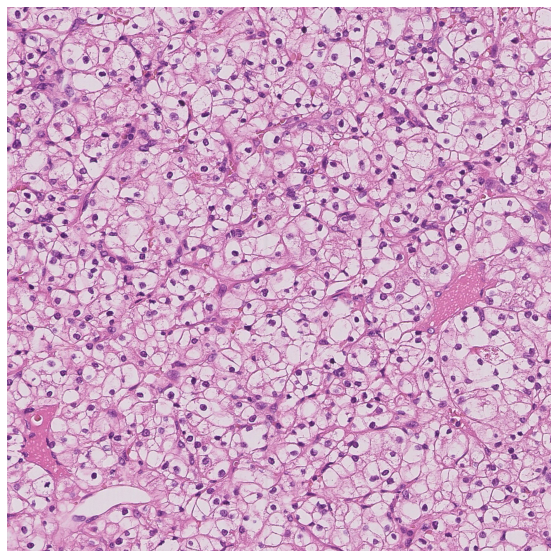

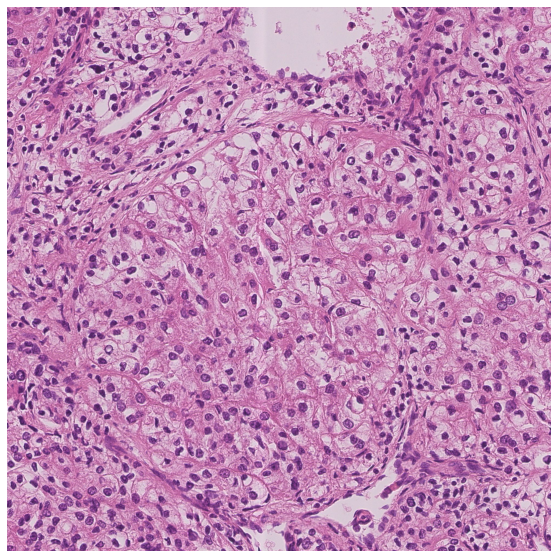

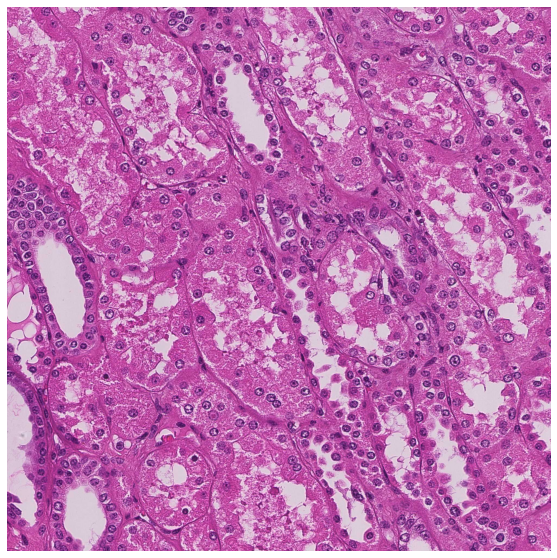

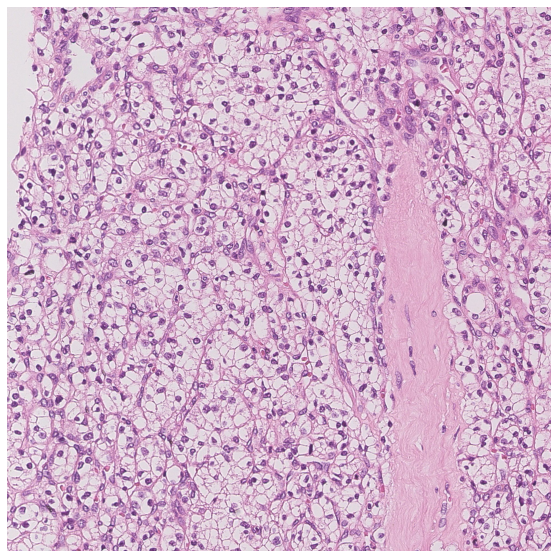

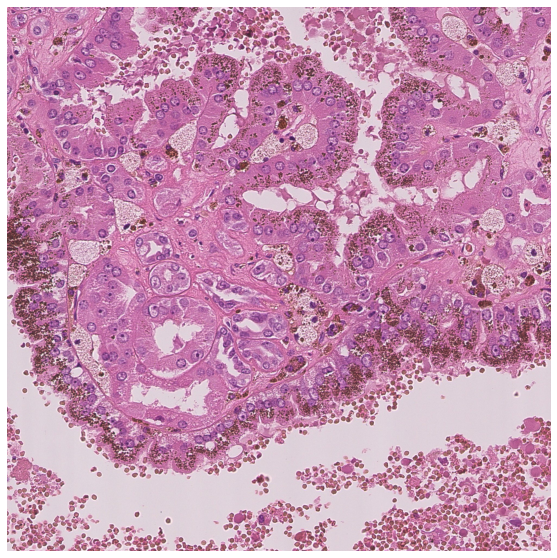

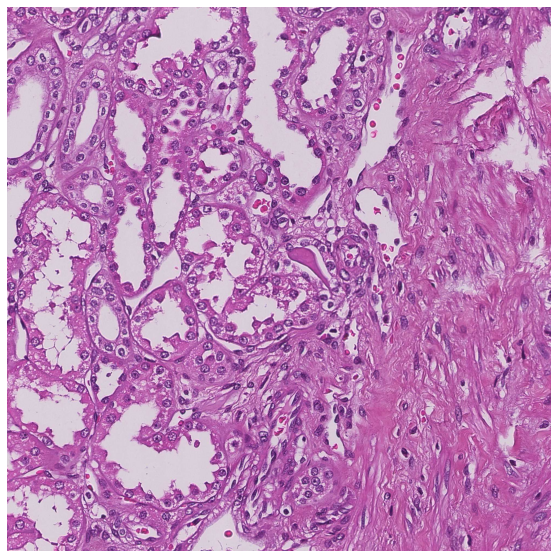

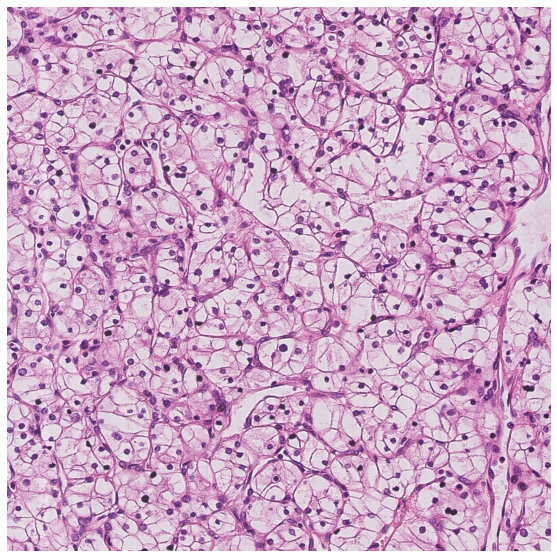

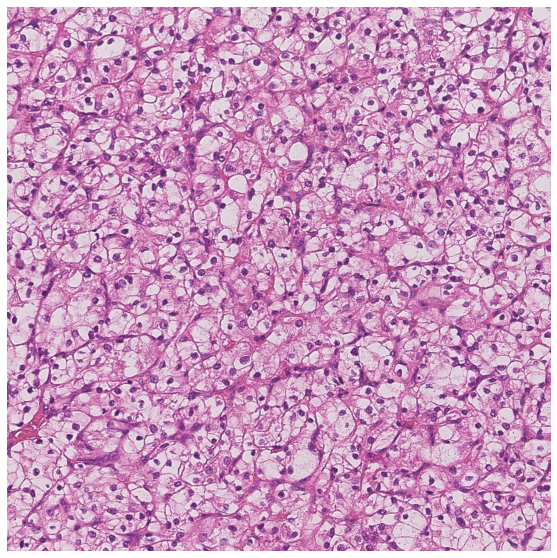

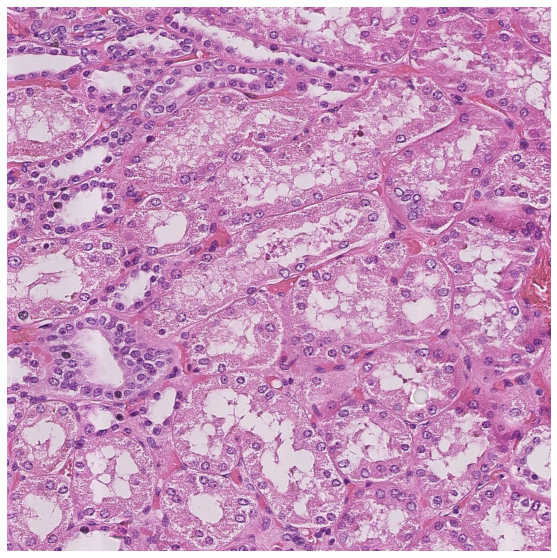

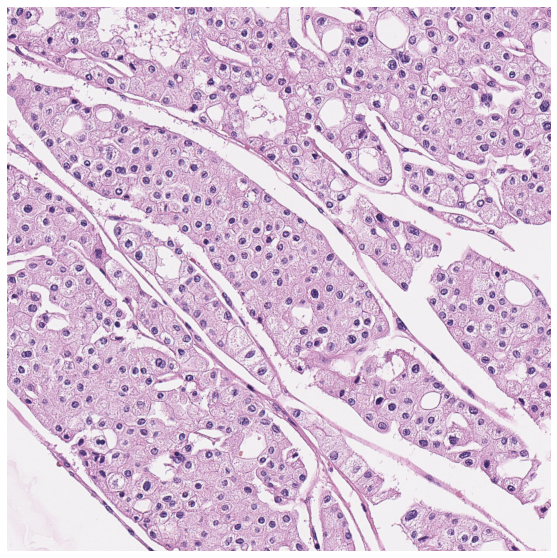

In [16]:
image_idxs = np.random.randint(0, len(df_dataset), 10)
for image_idx in image_idxs:
    print('-'*len(df_dataset.loc[image_idx].Path))
    print(df_dataset.loc[image_idx].Path)
    print("\tCancerType = {}".format(df_dataset.loc[image_idx].CancerType))
    print("\tTissueType = {}".format(df_dataset.loc[image_idx].TissueType))
    print("\tNode = {}".format(df_dataset.loc[image_idx].Node))
    print("\tLeaf1 = {}".format(df_dataset.loc[image_idx].Leaf1))
    print("\tLeaf2 = {}".format(df_dataset.loc[image_idx].Leaf2))
    print("\tCancerBinary = {}".format(df_dataset.loc[image_idx].CancerBinary))
    plot_image(df_dataset.loc[image_idx].Path)

# Classification
Experimental settings:



* **Train & test folds** grouped on patients (i.e.non-overlapping in terms of patients):


    Train:
        N-folds crossvalidation (grouped on patients) to find optimal model
    Test
        WSIs at image level
        WSIs at patient level

* Train datasets must be filtered and balanced for the following classification tasks:


    Tvs NT
    ccRCC vc pRCC vs ONCO vs CHROMO
    Two binary classifications between tumour types

## Train and test folds grouped on patients
Note that the train-test split of the patients MUST BE STRATIFIED in order to have all CancerType class also in test.
This will remove the following patients patients not containing tumor:

    HP131799
    HP193695
    HP145590
    HP123187
    HP197949

   These other patients do not have any annotation
   
    HP195524
    HP1213588
    HP19008963

All of them will be tested as WSIs (no one is in training)


In [17]:
# Dataframe for stratification of CancerType for train-test split >>>>
df_patients_cancer_type = df_dataset[['Patient', 'CancerType']]
df_patients_univocal = pd.DataFrame(df_dataset['Patient'].unique(), columns=["Patient"])
# This dataframe has the unique couple patient-CnacerType
df_merged = df_patients_univocal.merge(df_patients_cancer_type).dropna().drop_duplicates()
# <<<<
patients_all = df_merged['Patient'].unique()
patients_train, patients_test = sklearn.model_selection.train_test_split(patients_all,
                                                                         stratify=df_merged['CancerType'],
                                                                         test_size=0.33, random_state=42)

df_train = df_dataset[df_dataset['Patient'].isin(patients_train)]
df_test = df_dataset[df_dataset['Patient'].isin(patients_test)]

print(f"{len(df_train.Patient.unique())} in train\n{len(df_test.Patient.unique())} in test")

# Check common pateints between train and test
print("{} overlapping patients between train and test".format(len(set(df_train.Patient) & set(df_test.Patient))))

# Save BALANCED train for each label, a single test df and a whole dataset (train + test)
for LABEL in LABELS:
    df_train_cleaned = df_train[df_train[LABEL].notna()]
    minimum = min([sum(df_train_cleaned[LABEL] == class_) for class_ in set(df_train_cleaned[LABEL])])
    df_train_balanced = balance_df(df_train_cleaned, LABEL, minimum)
    df_train_balanced.to_csv(os.path.join(ROOTPATH_CROSSVALIDATION_DFs,
                                          "df-train-balanced_{}_whole.csv".format(LABEL)), 
                             index=False)
df_test.to_csv(os.path.join(ROOTPATH_CROSSVALIDATION_DFs,
                            "df-test-whole.csv"), 
               index=False)
df_dataset.to_csv(os.path.join(ROOTPATH_CROSSVALIDATION_DFs,
                               "df-dataset-train+test.csv"), 
                  index=False)

54 in train
27 in test
0 overlapping patients between train and test


## Prepare crossvalidation folds for optimal model search
This is done into the *train* fold previously obtained. Here we have balanced dataframes and NaN are dropped.

In [18]:
SAMPLE = 1 #  Test is reduced double
SAVE_DFs = True
group_kfold = GroupKFold(n_splits=CROSS_VALIDATION_SPLITS)
fold = 0
for train_index, test_index in group_kfold.split(df_train, groups=df_train.Patient):
    df_train_fold, df_test_fold = df_train.iloc[train_index], df_train.iloc[test_index]
    printmd("Fold {}:".format(fold))
    print("\t{}/{} of patients are in test".format(len(set(df_test_fold.Patient)), len(set(df_train.Patient))))
    print("\t{}/{} of patients are in train".format(len(set(df_train_fold.Patient)), len(set(df_train.Patient))))
    # Check common pateints between train and test
    print("\t{} overlapping patients between train and test".format(len(set(df_train_fold.Patient) & set(df_test_fold.Patient))))
    # Datasets balancing per class
    for LABEL in LABELS:
        """
        Considering only not NaN
        """
        df_train_fold_cleaned = df_train_fold[df_train_fold[LABEL].notna()]
        df_test_fold_cleaned = df_test_fold[df_test_fold[LABEL].notna()]
        """
        Training datasets are balanced per class. Not all the patients show all the classes.
        Class showing less samples is taken. 
        """
        # Balance df
        minimum = min([sum(df_train_fold_cleaned[LABEL] == class_) for class_ in set(df_train_fold_cleaned[LABEL])])
        df_train_fold_balanced = balance_df(df_train_fold_cleaned, LABEL, minimum)
        # Eventually reduce dataframe size
        df_train_fold_balanced = df_train_fold_balanced.sample(int(SAMPLE*len(df_train_fold_balanced)), random_state=1)
        if SAMPLE !=1:
            df_test_fold_cleaned = df_test_fold_cleaned.sample(int(SAMPLE*0.5*len(df_test_fold_cleaned)), random_state=1)
        printmd(pd.pivot_table(df_train_fold_balanced, values="Path", index=LABEL, aggfunc="count").to_markdown())
        printmd("\t\tTot samples: {}".format(len(df_train_fold_balanced)))
        # Save dataframes (one per classification task)
        if SAVE_DFs:
            df_train_fold_balanced.to_csv(os.path.join(ROOTPATH_CROSSVALIDATION_DFs, 
                                                       "df-train-balanced_{}_fold-{}.csv".format(LABEL, fold)), 
                                          index=False)
            df_test_fold_cleaned.to_csv(os.path.join(ROOTPATH_CROSSVALIDATION_DFs, "df-test_{}_fold-{}.csv".format(LABEL, fold)), 
                                        index=False)
    fold += 1
print("Done. See{}".format(ROOTPATH_CROSSVALIDATION_DFs))

Fold 0:

	28/54 of patients are in test
	26/54 of patients are in train
	0 overlapping patients between train and test


| CancerBinary   |   Path |
|:---------------|-------:|
| cancer         |   4289 |
| not_cancer     |   4289 |

		Tot samples: 8578

| CancerType   |   Path |
|:-------------|-------:|
| CHROMO       |    951 |
| ONCO         |    951 |
| ccRCC        |    951 |
| pRCC         |    951 |

		Tot samples: 3804

| NotCancerAllTumors   |   Path |
|:---------------------|-------:|
| CHROMO               |    951 |
| ONCO                 |    951 |
| ccRCC                |    951 |
| not_cancer           |    951 |
| pRCC                 |    951 |

		Tot samples: 4755

| Node         |   Path |
|:-------------|-------:|
| ONCO+pRCC    |   4054 |
| ccRCC+CHROMO |   4054 |

		Tot samples: 8108

| Leaf1   |   Path |
|:--------|-------:|
| CHROMO  |   1291 |
| ccRCC   |   1291 |

		Tot samples: 2582

| Leaf2   |   Path |
|:--------|-------:|
| ONCO    |    951 |
| pRCC    |    951 |

		Tot samples: 1902

Fold 1:

	26/54 of patients are in test
	28/54 of patients are in train
	0 overlapping patients between train and test


| CancerBinary   |   Path |
|:---------------|-------:|
| cancer         |   5648 |
| not_cancer     |   5648 |

		Tot samples: 11296

| CancerType   |   Path |
|:-------------|-------:|
| CHROMO       |    242 |
| ccRCC        |    242 |
| pRCC         |    242 |

		Tot samples: 726

| NotCancerAllTumors   |   Path |
|:---------------------|-------:|
| CHROMO               |    242 |
| ccRCC                |    242 |
| not_cancer           |    242 |
| pRCC                 |    242 |

		Tot samples: 968

| Node         |   Path |
|:-------------|-------:|
| ONCO+pRCC    |   5972 |
| ccRCC+CHROMO |   5972 |

		Tot samples: 11944

| Leaf1   |   Path |
|:--------|-------:|
| CHROMO  |    242 |
| ccRCC   |    242 |

		Tot samples: 484

| Leaf2   |   Path |
|:--------|-------:|
| pRCC    |   9387 |

		Tot samples: 9387

Done. See/space/ponzio/Morpheme_v2/data/RandomTree_cc+CHROMO-ONCO+pRCC_dfs


In [19]:
df_train_fold_balanced.head(20)

,Patient,CancerType,Annotation,TissueType,Path,Node,Leaf1,Leaf2,CancerBinary,NotCancerAllTumors
Image_ID,,,,,,,,,,
8196,HP18.11474.pRCC.scn,pRCC,6,tumor,/space/ponzio/Morpheme_v2/data/pRCC/6/tumor/An...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
9439,HP18.11474.pRCC.scn,pRCC,8,tumor,/space/ponzio/Morpheme_v2/data/pRCC/8/tumor/An...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
10586,HP18.11474.pRCC.scn,pRCC,9,tumor,/space/ponzio/Morpheme_v2/data/pRCC/9/tumor/An...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
13396,HP18.11474.pRCC.scn,pRCC,14,tumor,/space/ponzio/Morpheme_v2/data/pRCC/14/tumor/A...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
10265,HP18.11474.pRCC.scn,pRCC,9,tumor,/space/ponzio/Morpheme_v2/data/pRCC/9/tumor/An...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
15086,HP18.5818.pRCC.scn,pRCC,19,tumor,/space/ponzio/Morpheme_v2/data/pRCC/19/tumor/A...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
1174,HP12.6710.pRCC.scn,pRCC,7_pre,tumor,/space/ponzio/Morpheme_v2/data/pRCC/7_pre/tumo...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
16254,HP18.5818.pRCC.scn,pRCC,20,tumor,/space/ponzio/Morpheme_v2/data/pRCC/20/tumor/A...,ONCO+pRCC,NaN,pRCC,cancer,pRCC
9223,HP18.11474.pRCC.scn,pRCC,8,tumor,/space/ponzio/Morpheme_v2/data/pRCC/8/tumor/An...,ONCO+pRCC,NaN,pRCC,cancer,pRCC


# Data vis

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


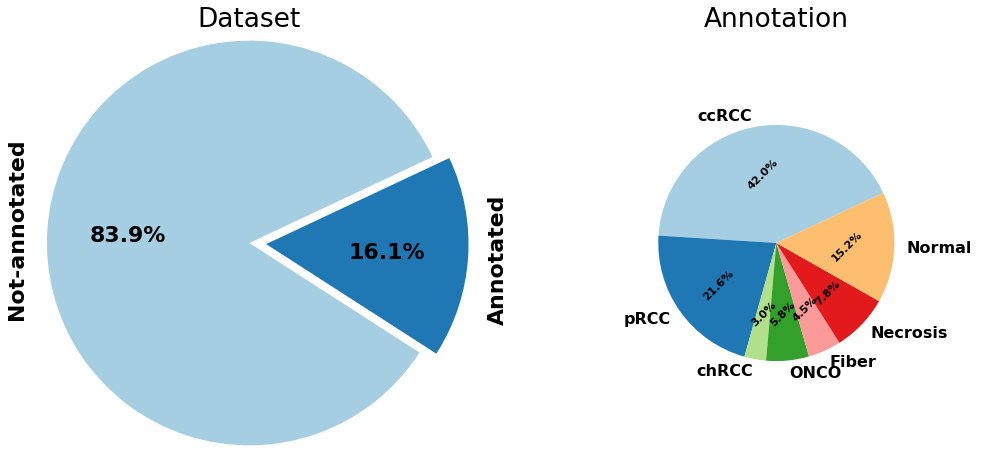

In [20]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import numpy as np
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
matplotlib.rc('font', **font)

from matplotlib import cm
colors = cm.get_cmap("Paired").colors

# make figure and assign axis objects
fig = plt.figure(figsize=(17, 15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.subplots_adjust(wspace=0.25)

# large pie chart parameters
ratios = [328428, 62998]
ratios = [r/sum(ratios) for r in ratios]
labels = ["Not-annotated", "Annotated"]
explode = [0, 0.1]
# rotate so that first wedge is split by the x-axis
angle = 30 * ratios[0]
pie1 = ax1.pie(ratios, autopct='%1.1f%%', startangle=angle,
               labels=labels, radius=1.2, explode=explode, colors=colors)
for tx in pie1[1]:
    rot = tx.get_rotation()
    tx.set_rotation(90)
# small pie chart parameters
ratios = [26465,
          13637,
          1869,
          3684,
          2840,
          4939,
          9564]
ratios = [r/sum(ratios) for r in ratios]
labels = ["ccRCC",
          "pRCC",
          "chRCC",
          "ONCO",
          "Fiber",
          "Necrosis",
          "Normal"]
explode = [0]*len(ratios)
width = .2

pie2= ax2.pie(ratios, autopct='%1.1f%%', startangle=angle, colors=colors,
              labels=labels, radius=0.7, textprops={'size': 'smaller', 'size': 16})

ax1.set_title('Dataset')
ax2.set_title('Annotation')

# Set text properties
for tx in pie2[1]:
    rot = tx.get_rotation()
    tx.set_rotation(0)
for tx in pie2[2]:
    rot = tx.get_rotation()
    tx.set_rotation(45)
    tx.set_fontsize(11)
fig.savefig("pie.png")

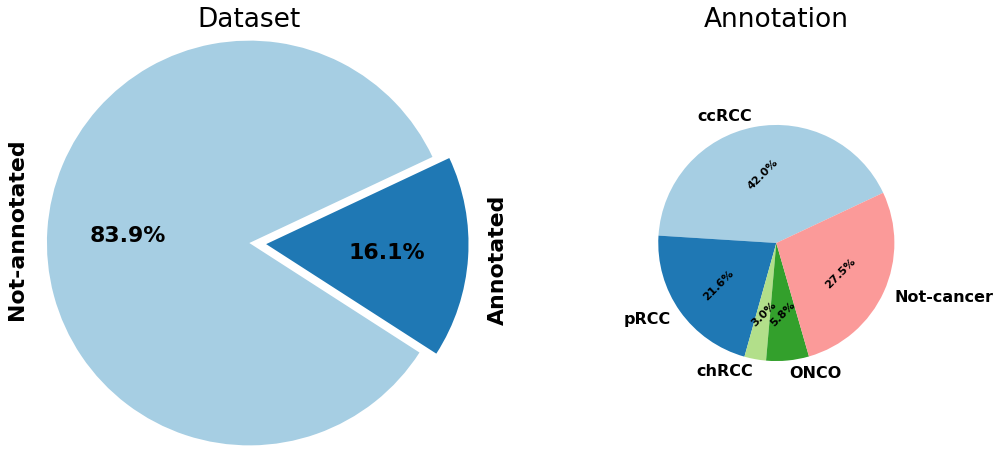

In [21]:
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.patches import ConnectionPatch
import numpy as np
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 22}
matplotlib.rc('font', **font)

from matplotlib import cm
colors = cm.get_cmap("Paired").colors

# make figure and assign axis objects
fig = plt.figure(figsize=(17, 15))
ax1 = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
fig.subplots_adjust(wspace=0.25)

# large pie chart parameters
ratios = [328428, 62998]
ratios = [r/sum(ratios) for r in ratios]
labels = ["Not-annotated", "Annotated"]
explode = [0, 0.1]
# rotate so that first wedge is split by the x-axis
angle = 30 * ratios[0]
pie1 = ax1.pie(ratios, autopct='%1.1f%%', startangle=angle,
               labels=labels, radius=1.2, explode=explode, colors=colors)
for tx in pie1[1]:
    rot = tx.get_rotation()
    tx.set_rotation(90)
# small pie chart parameters
ratios = [26465,
          13637,
          1869,
          3684,
          2840 + 4939 + 9564]
ratios = [r/sum(ratios) for r in ratios]
labels = ["ccRCC",
          "pRCC",
          "chRCC",
          "ONCO",
          "Not-cancer"]
explode = [0]*len(ratios)
width = .2

pie2= ax2.pie(ratios, autopct='%1.1f%%', startangle=angle, colors=colors,
              labels=labels, radius=0.7, textprops={'size': 'smaller', 'size': 16})

ax1.set_title('Dataset')
ax2.set_title('Annotation')

# Set text properties
for tx in pie2[1]:
    rot = tx.get_rotation()
    tx.set_rotation(0)
for tx in pie2[2]:
    rot = tx.get_rotation()
    tx.set_rotation(45)
    tx.set_fontsize(11)
fig.savefig("pie.png")